<div style="position:relative; width:100%;">
  <!-- Logo absoluto en la esquina superior derecha (encima del título) -->
  <img src="../assets/OsGeolab.png"
       alt="Logo semillero"
       style="position:absolute; top:0; right:0; width:200px; z-index:50; pointer-events:none;">
    <img src="../assets/Ud.png"
       alt="Logo ud"
       style="position:absolute; top:0; left:0; width:100px; z-index:50; pointer-events:none;">
  <!-- Título centrado; le damos padding-top para que el logo pueda quedar encima -->
  <h2 style="text-align:center; margin:0; padding-top:100px;">
    Estudio de viabilidad en la delimitación de coberturas con imágenes satelitales mediante el modelo Segment Anything: Comparación con la metodología CORINE Land Cover en el municipio de Guatavita.
  </h2>
</div>

<h2 style="text-align:center;" >Tutorial: Uso de prompts geométricos en la segmentación</h2>

Autores:
*   **Cristian Stiven Florez Macias**
*   **Sergio Andres Escobar Eslava** 

In [1]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install segment-geospatial
!pip install segment-anything-hq

Looking in indexes: https://download.pytorch.org/whl/cu118


In [2]:
import geopandas as gpd
import rasterio
from rasterio import features
import os
import numpy as np
from samgeo.text_sam import LangSAM
import matplotlib.pyplot as plt
import cv2
import torch
from segment_anything_hq import sam_model_registry, SamPredictor
from typing import Dict

# Verificar que CUDA esté disponible
print(f"CUDA disponible: {torch.cuda.is_available()}")
print(f"Versión de PyTorch: {torch.__version__}")

CUDA disponible: True
Versión de PyTorch: 2.7.1+cu118


In [3]:
sam_checkpoint = "../model/sam_hq_vit_h.pth"
model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device="cuda")


<All keys matched successfully>


Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

📦 Total de polígonos a segmentar: 2
📦 Polígono 1/2 - Box: [  1 174  69 255]
   ✅ Score: 0.804
📦 Polígono 2/2 - Box: [ 69  72 254 254]
   ✅ Score: 0.983

🎯 Segmentación completa - Promedio de scores: 0.894


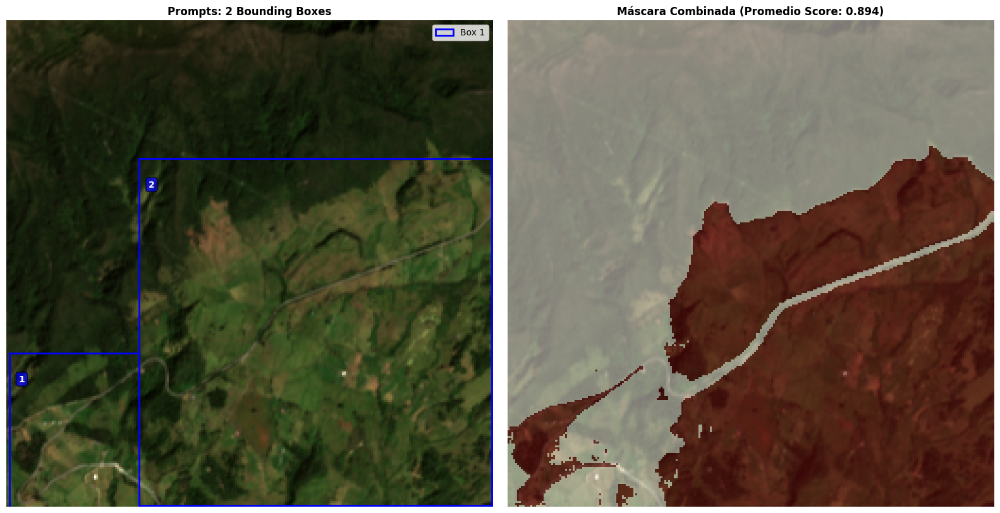

In [58]:
predictor = SamPredictor(sam)
image_path = '../tiles/Sentinel/Guatavita_22_crop.tif'
box_coords_path = '../tiles/Poligonos/Guatavita_22_box.geojson'
raster = rasterio.open(image_path)
image = raster.read().transpose(1, 2, 0)
predictor.set_image(image)

# 1) Leer el CRS del raster de referencia
with rasterio.open(image_path) as src:
    raster_crs = src.crs
    
# 2) Leer bounding box del GeoJSON
gdf = gpd.read_file(box_coords_path)
if gdf.crs is None:
    gdf = gdf.set_crs("EPSG:4326")

print(f"📦 Total de polígonos a segmentar: {len(gdf)}")

# 🔄 SEGMENTACIÓN ITERATIVA
from rasterio.transform import rowcol
from matplotlib.patches import Rectangle

# Inicializar máscara combinada
combined_mask = np.zeros((image.shape[0], image.shape[1]), dtype=bool)
all_boxes = []  # Para visualización
all_scores = []

# Iterar sobre cada polígono
for idx, geom in enumerate(gdf.geometry):
    with rasterio.open(image_path) as src:
        # Obtener bounds del polígono individual
        bounds = geom.bounds  # [minx, miny, maxx, maxy]
        
        # Convertir esquinas a píxeles
        min_row, min_col = rowcol(src.transform, bounds[0], bounds[3])
        max_row, max_col = rowcol(src.transform, bounds[2], bounds[1])
        
        # SAM espera [x_min, y_min, x_max, y_max]
        box_coords = np.array([min_col, min_row, max_col, max_row])
        all_boxes.append(box_coords)
    
    print(f"📦 Polígono {idx+1}/{len(gdf)} - Box: {box_coords}")
    
    # Segmentar polígono individual
    masks, scores, logits = predictor.predict(
        box=box_coords,
        multimask_output=True
    )
    
    # Seleccionar mejor máscara
    best_mask_idx = np.argmax(scores)
    best_score = scores[best_mask_idx]
    all_scores.append(best_score)
    
    # Agregar a máscara combinada (OR lógico)
    combined_mask = combined_mask | masks[best_mask_idx]
    
    print(f"   ✅ Score: {best_score:.3f}")

print(f"\n🎯 Segmentación completa - Promedio de scores: {np.mean(all_scores):.3f}")

# Visualización con todos los boxes
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Panel 1: Imagen con todos los bounding boxes
axes[0].imshow(image)
for i, box in enumerate(all_boxes):
    rect = Rectangle(
        (box[0], box[1]),
        box[2] - box[0],
        box[3] - box[1],
        linewidth=2,
        edgecolor='blue',
        facecolor='none',
        label=f'Box {i+1}' if i == 0 else ""
    )
    axes[0].add_patch(rect)
    # Añadir número del polígono
    axes[0].text(box[0] + 5, box[1] + 15, str(i+1), 
                color='white', fontsize=10, fontweight='bold',
                bbox=dict(boxstyle='round', facecolor='blue', alpha=0.7))

axes[0].set_title(f'Prompts: {len(all_boxes)} Bounding Boxes', fontsize=12, fontweight='bold')
axes[0].axis('off')
axes[0].legend(loc='upper right')

# Panel 2: Máscara combinada
axes[1].imshow(image)
axes[1].imshow(combined_mask, alpha=0.5, cmap='Reds')
axes[1].set_title(f'Máscara Combinada (Promedio Score: {np.mean(all_scores):.3f})', 
                  fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Opcional: Guardar máscara combinada
# combined_mask_uint8 = (combined_mask.astype(np.uint8)) * 255


############################################################
🔄 Procesando tile 0 con código CORINE 512
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 0
   • Código CORINE: 512 - Cuerpos de agua
   • Imagen: ../tiles/Sentinel/Guatavita_0_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_0_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA CON SAM
   📦 Procesando box 1/1
      ✅ Score: 0.970
   ✅ Promedio de scores: 0.970
   💾 Máscara guardada: ../tiles/segmentation_box/Guatavita_0_box_mask.tif

🗺️ PASO 3: CONVERSIÓN GEOJSON A RASTER
   ✅ Ground truth generado: ../tiles/LandUseRaster/Guatavita_0_codigo512_raster.tif

📊 PASO 4: CÁLCULO DE MÉTRICAS


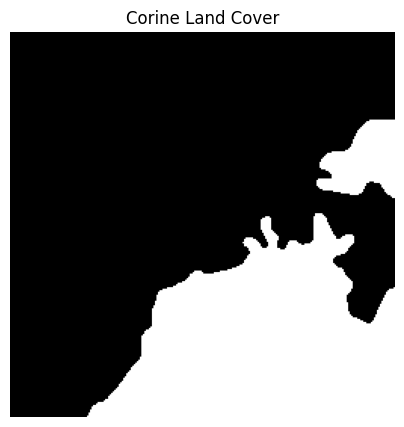

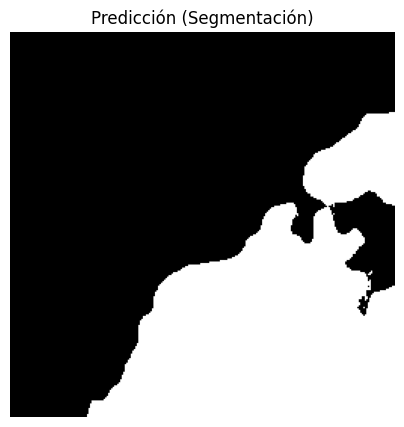

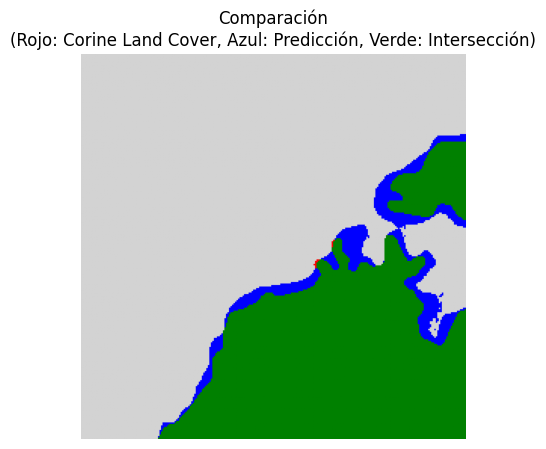

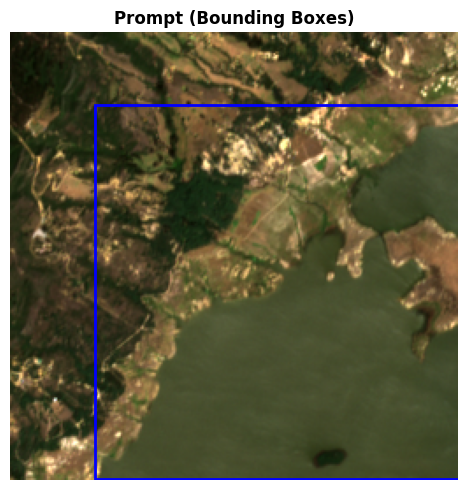


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 86.89%
   • DICE Coefficient:              92.99%
   • Pixel Accuracy:                95.60%
   • F1-Score:                      92.99%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.93%
   • FPR (False Positive Rate):     6.18%
   • Precision:                     86.95%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           18970
   • False Positives (FP):          2847
   • True Negatives (TN):           43194
   • False Negatives (FN):          14

############################################################
🔄 Procesando tile 1 con código CORINE 512
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 1
   • Código CORINE: 512 - Cuerpos de agua
   • Imagen: ../tiles/Sentinel/Guatavita_1_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_1_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA CON 

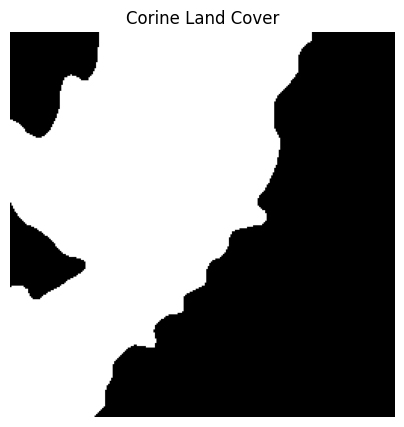

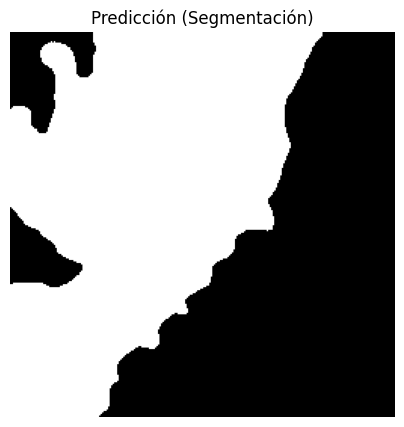

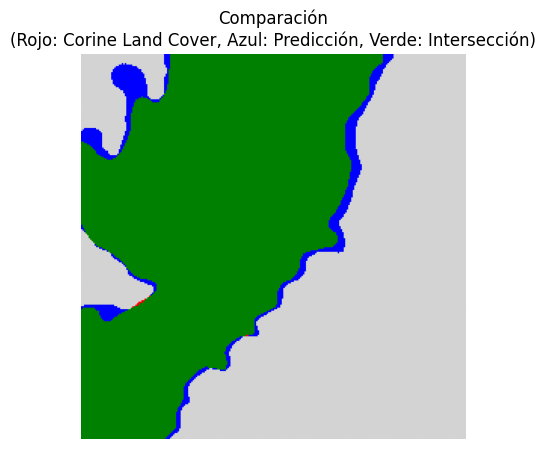

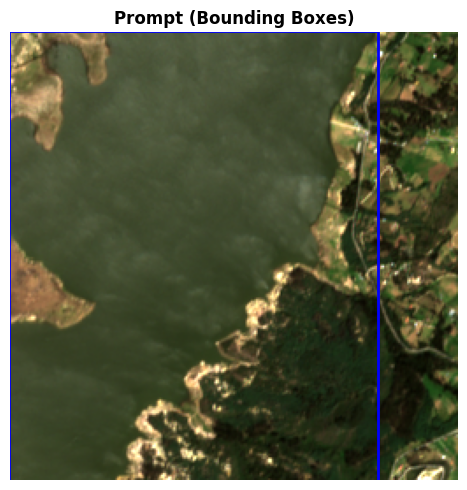


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 93.00%
   • DICE Coefficient:              96.37%
   • Pixel Accuracy:                96.37%
   • F1-Score:                      96.37%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.96%
   • FPR (False Positive Rate):     6.99%
   • Precision:                     93.04%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           31384
   • False Positives (FP):          2349
   • True Negatives (TN):           31278
   • False Negatives (FN):          14

############################################################
🔄 Procesando tile 2 con código CORINE 512
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 2
   • Código CORINE: 512 - Cuerpos de agua
   • Imagen: ../tiles/Sentinel/Guatavita_2_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_2_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA CON 

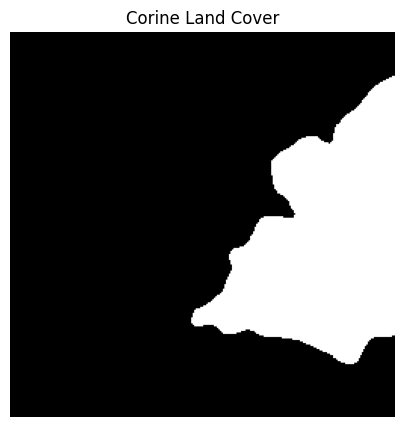

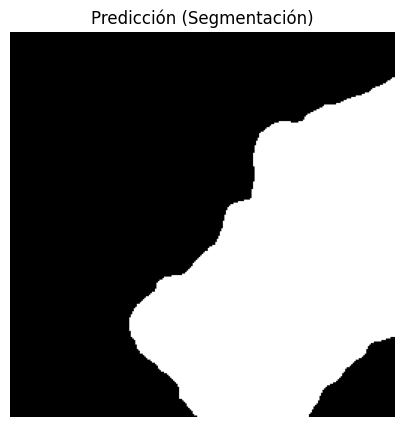

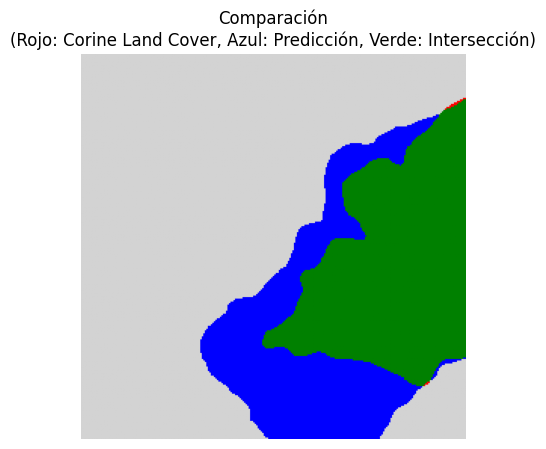

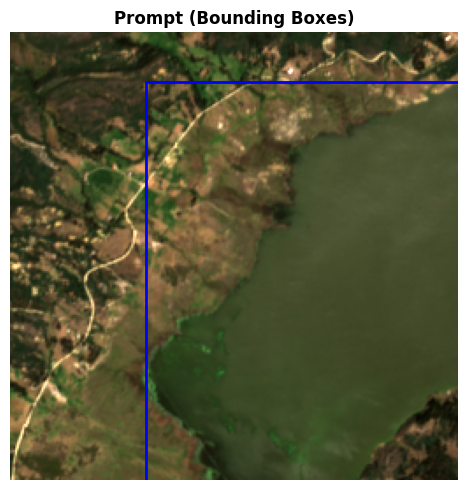


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 57.55%
   • DICE Coefficient:              73.05%
   • Pixel Accuracy:                83.81%
   • F1-Score:                      73.05%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.82%
   • FPR (False Positive Rate):     20.71%
   • Precision:                     57.61%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           14273
   • False Positives (FP):          10503
   • True Negatives (TN):           40223
   • False Negatives (FN):          26

############################################################
🔄 Procesando tile 3 con código CORINE 512
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 3
   • Código CORINE: 512 - Cuerpos de agua
   • Imagen: ../tiles/Sentinel/Guatavita_3_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_3_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA CO

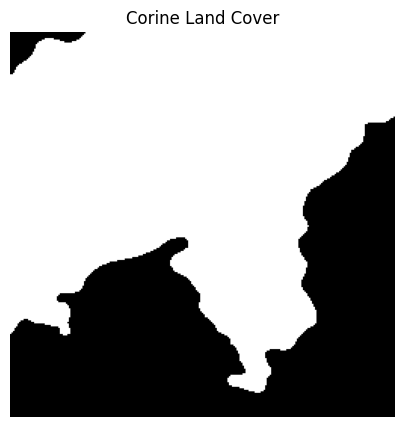

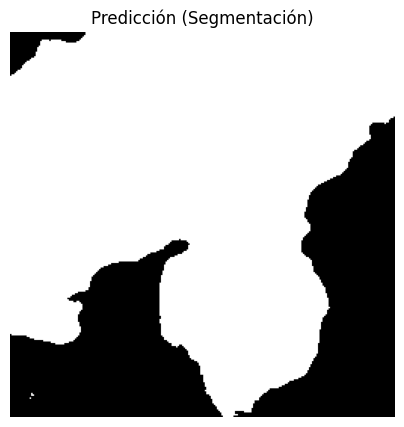

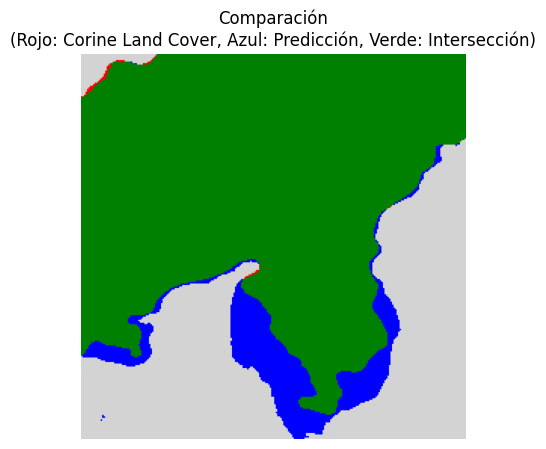

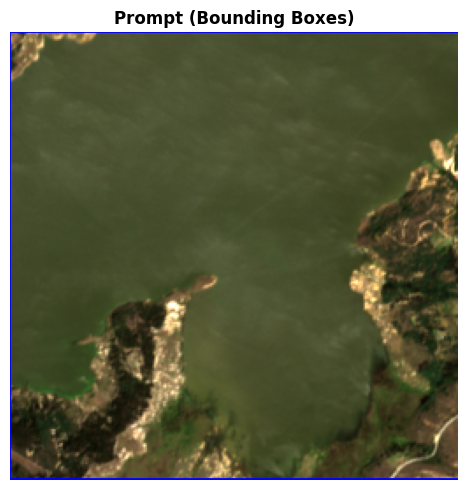


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 89.00%
   • DICE Coefficient:              94.18%
   • Pixel Accuracy:                92.39%
   • F1-Score:                      94.18%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.80%
   • FPR (False Positive Rate):     19.55%
   • Precision:                     89.16%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           40039
   • False Positives (FP):          4870
   • True Negatives (TN):           20037
   • False Negatives (FN):          79

############################################################
🔄 Procesando tile 4 con código CORINE 111
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 4
   • Código CORINE: 111 - Tejido urbano continuo
   • Imagen: ../tiles/Sentinel/Guatavita_4_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_4_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERAT

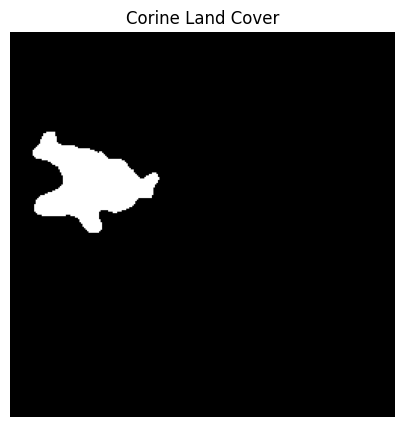

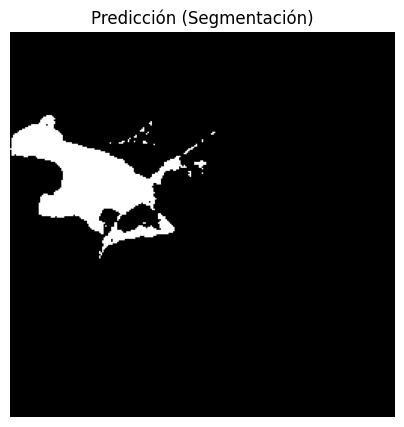

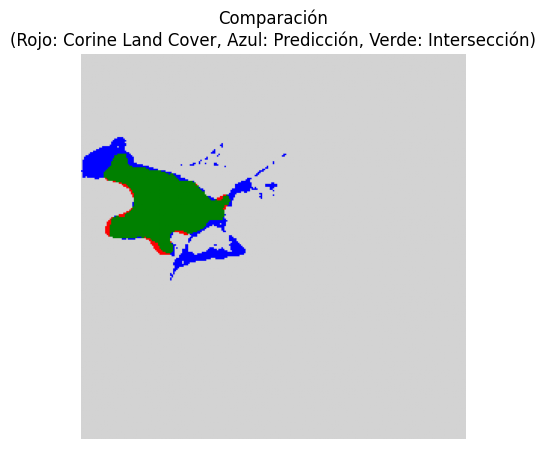

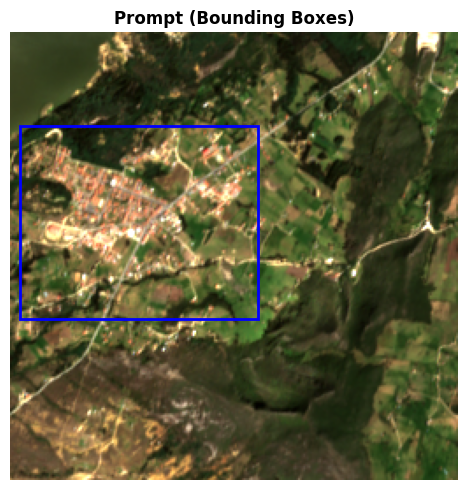


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 66.13%
   • DICE Coefficient:              79.61%
   • Pixel Accuracy:                97.89%
   • F1-Score:                      79.61%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    94.90%
   • FPR (False Positive Rate):     1.98%
   • Precision:                     68.57%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           2681
   • False Positives (FP):          1229
   • True Negatives (TN):           60971
   • False Negatives (FN):          144

############################################################
🔄 Procesando tile 5 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 5
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_5_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_5_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 4 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA CON S

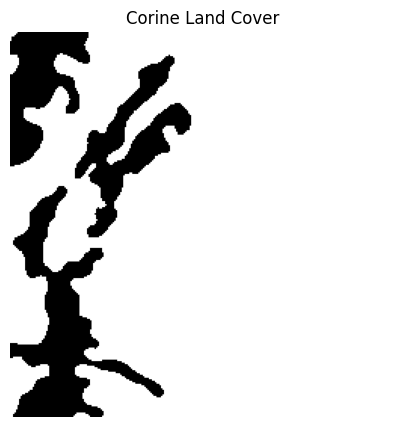

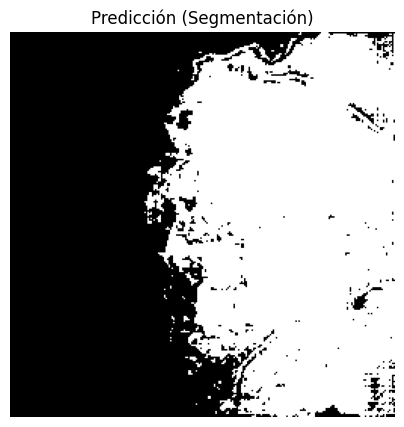

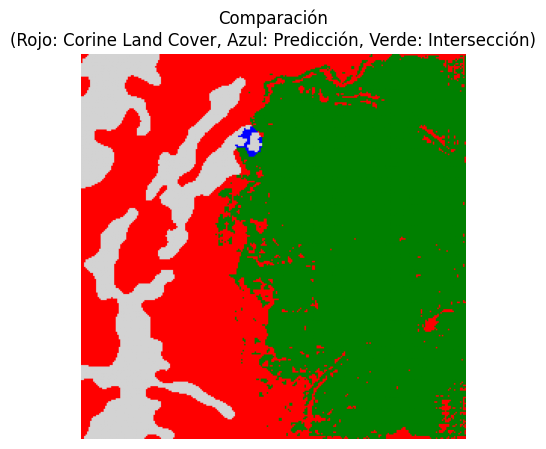

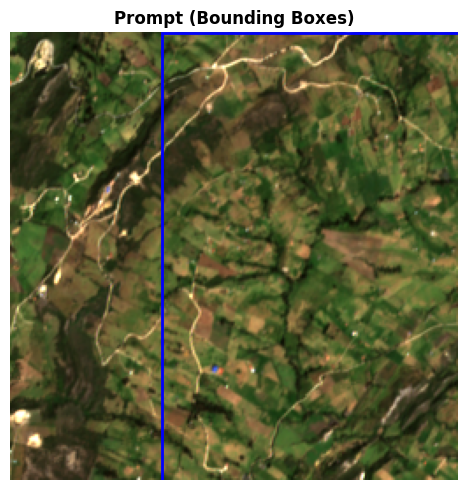


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 57.90%
   • DICE Coefficient:              73.33%
   • Pixel Accuracy:                64.31%
   • F1-Score:                      73.33%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    58.01%
   • FPR (False Positive Rate):     1.12%
   • Precision:                     99.65%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           31915
   • False Positives (FP):          112
   • True Negatives (TN):           9901
   • False Negatives (FN):          23097

############################################################
🔄 Procesando tile 6 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 6
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_6_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_6_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA CON 

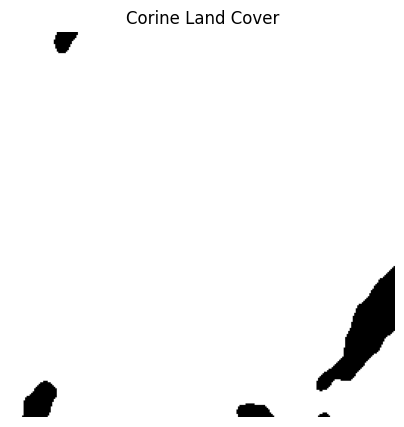

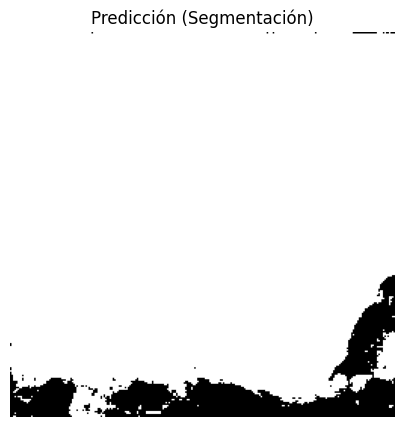

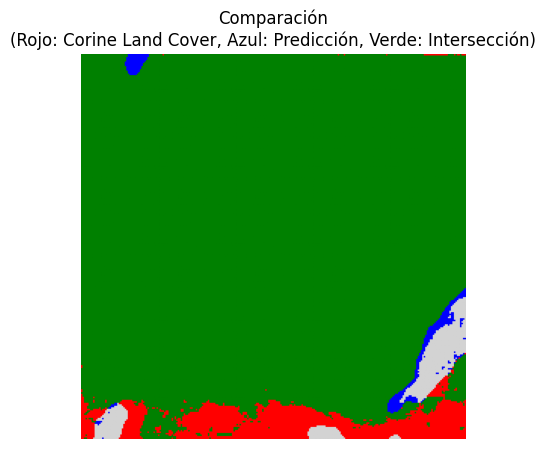

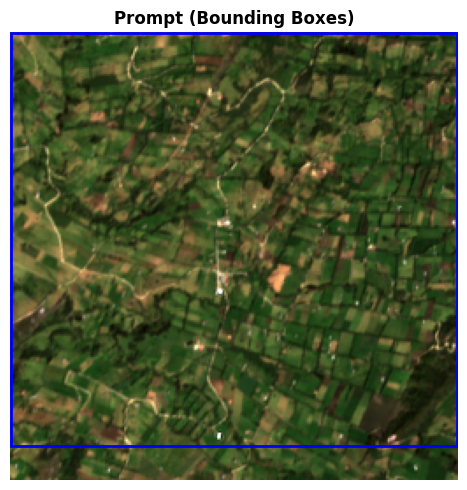


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 92.57%
   • DICE Coefficient:              96.14%
   • Pixel Accuracy:                92.76%
   • F1-Score:                      96.14%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    93.53%
   • FPR (False Positive Rate):     27.70%
   • Precision:                     98.91%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           58631
   • False Positives (FP):          647
   • True Negatives (TN):           1689
   • False Negatives (FN):          4058

############################################################
🔄 Procesando tile 7 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 7
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_7_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_7_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

🎯 

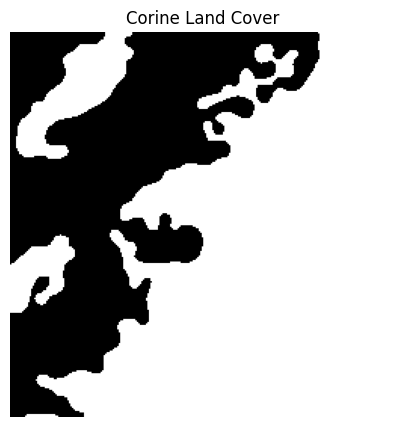

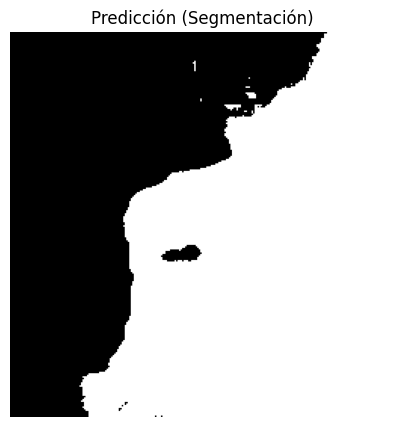

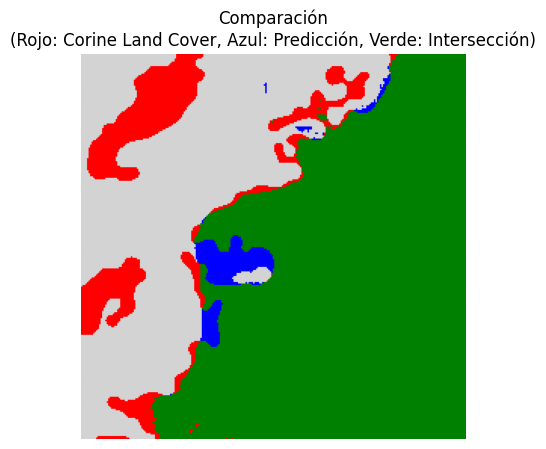

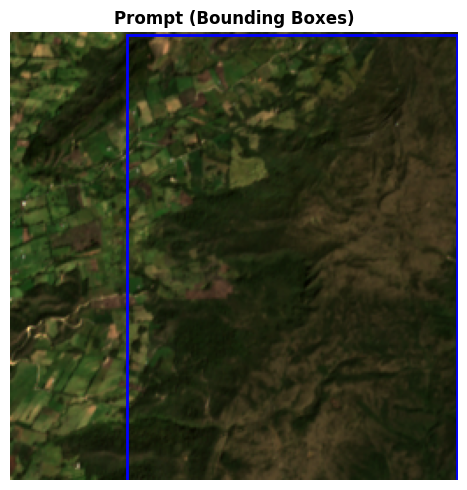


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 82.56%
   • DICE Coefficient:              90.45%
   • Pixel Accuracy:                88.42%
   • F1-Score:                      90.45%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    85.46%
   • FPR (False Positive Rate):     6.29%
   • Precision:                     96.05%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           35657
   • False Positives (FP):          1466
   • True Negatives (TN):           21835
   • False Negatives (FN):          6067

############################################################
🔄 Procesando tile 8 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 8
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_8_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_8_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 3 polígonos/boxes

🎯

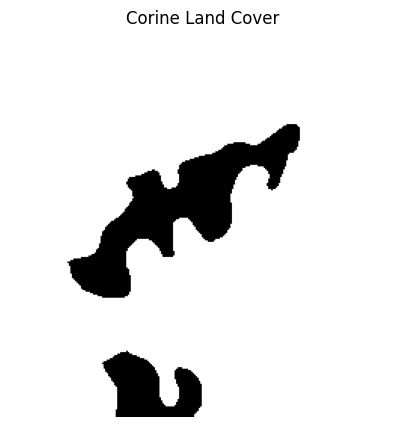

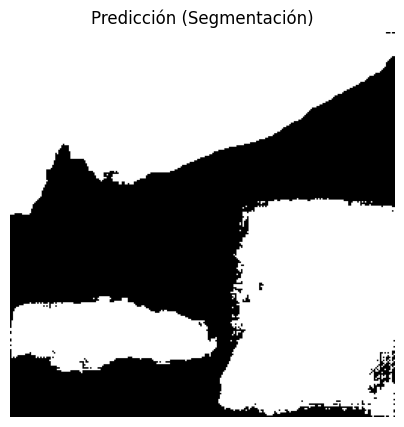

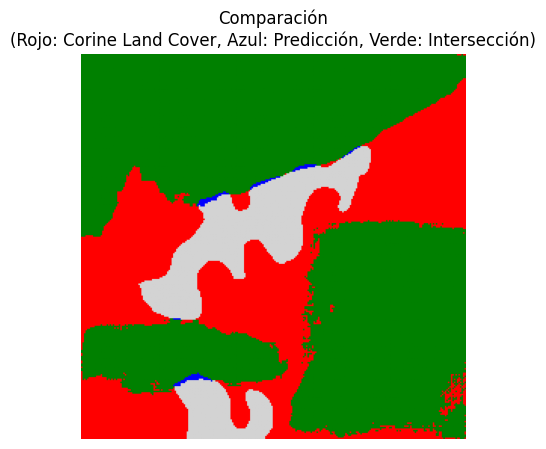

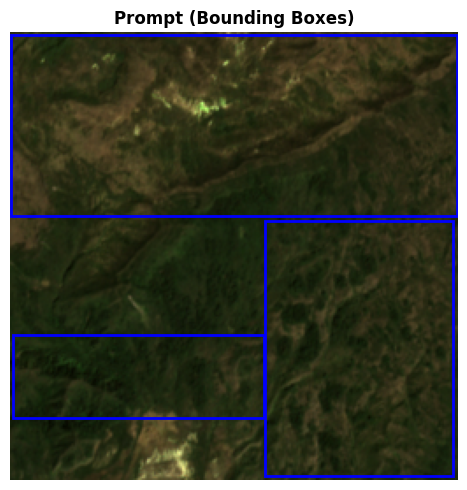


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 65.70%
   • DICE Coefficient:              79.30%
   • Pixel Accuracy:                69.48%
   • F1-Score:                      79.30%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    65.94%
   • FPR (False Positive Rate):     2.82%
   • Precision:                     99.46%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           38018
   • False Positives (FP):          208
   • True Negatives (TN):           7159
   • False Negatives (FN):          19640

############################################################
🔄 Procesando tile 9 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 9
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_9_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_9_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

🎯 

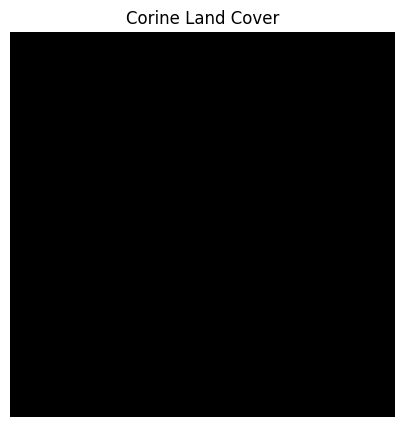

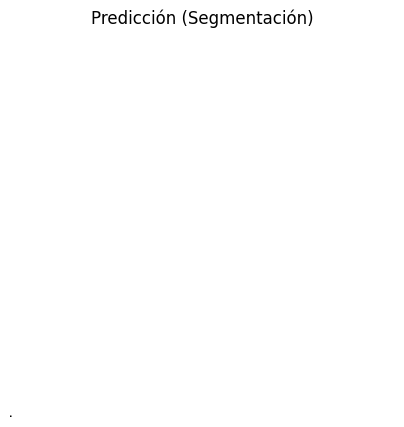

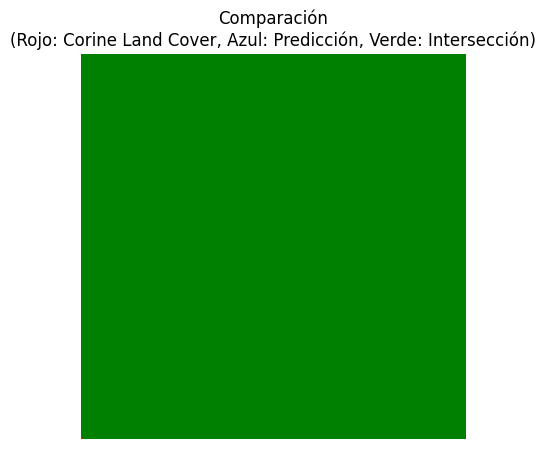

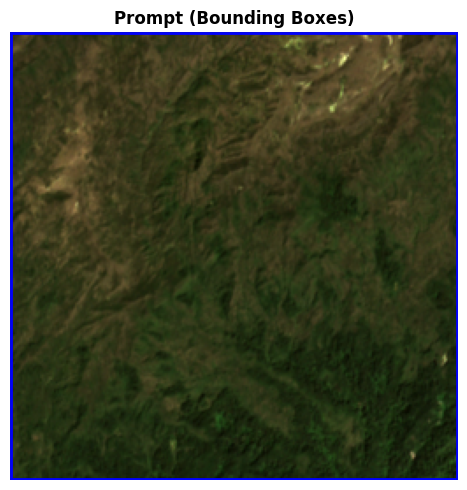


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 100.00%
   • DICE Coefficient:              100.00%
   • Pixel Accuracy:                100.00%
   • F1-Score:                      100.00%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    100.00%
   • FPR (False Positive Rate):     0.00%
   • Precision:                     100.00%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           65024
   • False Positives (FP):          0
   • True Negatives (TN):           0
   • False Negatives (FN):          1

############################################################
🔄 Procesando tile 10 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 10
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_10_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_10_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 4 polígonos/boxes

🎯

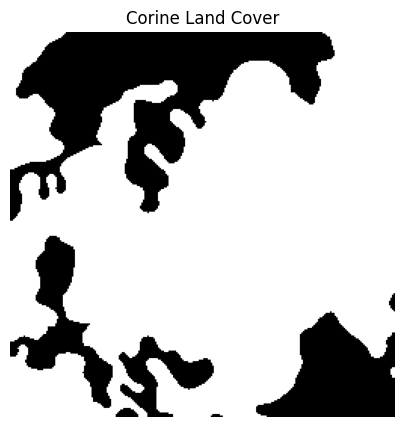

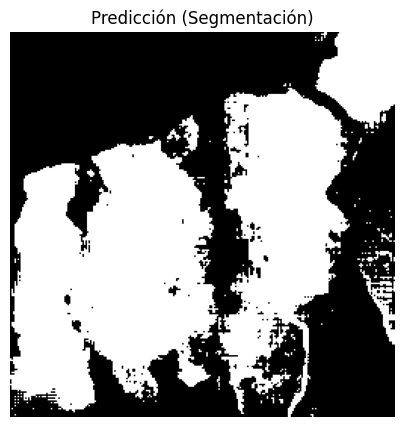

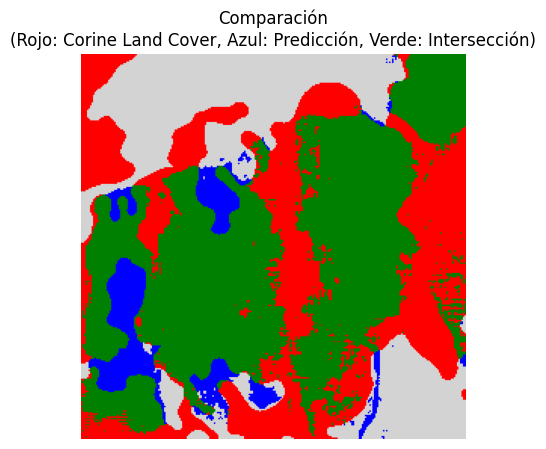

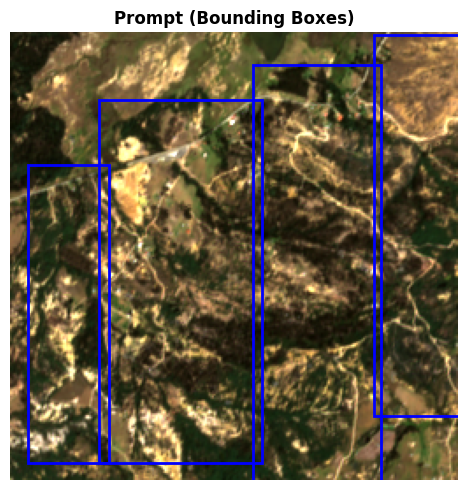


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 54.94%
   • DICE Coefficient:              70.92%
   • Pixel Accuracy:                65.05%
   • F1-Score:                      70.92%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    59.76%
   • FPR (False Positive Rate):     21.83%
   • Precision:                     87.18%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           27710
   • False Positives (FP):          4073
   • True Negatives (TN):           14587
   • False Negatives (FN):          18655

############################################################
🔄 Procesando tile 11 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 11
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_11_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_11_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 3 polígonos/bo

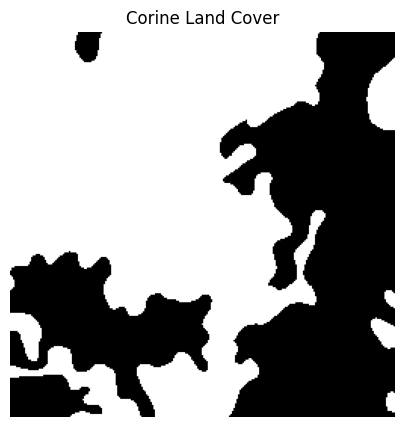

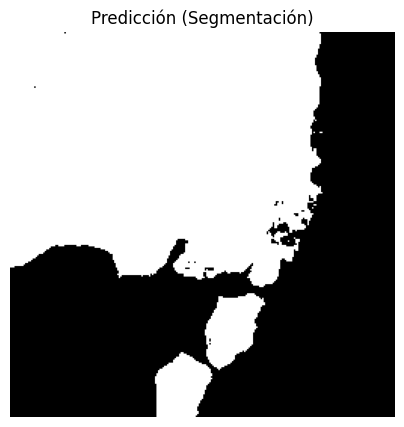

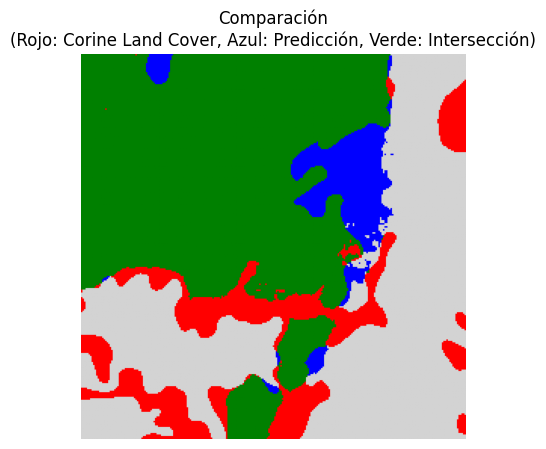

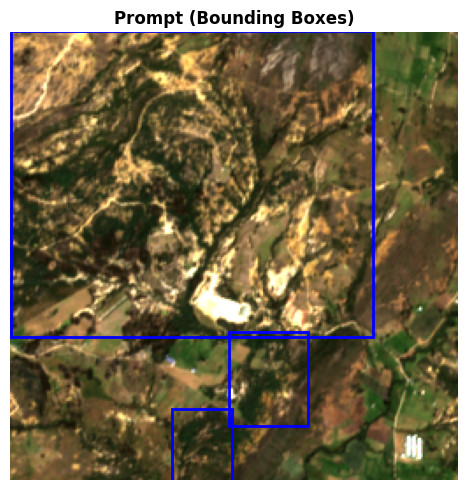


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 71.89%
   • DICE Coefficient:              83.64%
   • Pixel Accuracy:                82.37%
   • F1-Score:                      83.64%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    79.41%
   • FPR (False Positive Rate):     13.74%
   • Precision:                     88.35%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           29312
   • False Positives (FP):          3864
   • True Negatives (TN):           24249
   • False Negatives (FN):          7600

############################################################
🔄 Procesando tile 12 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 12
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_12_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_12_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 3 polígonos/box

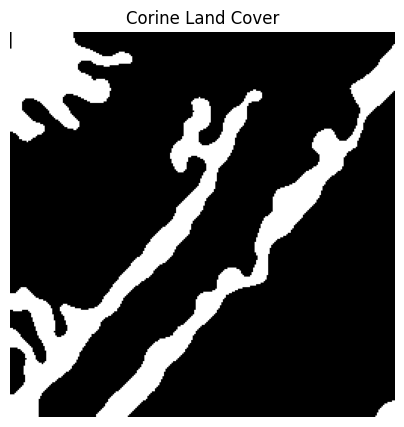

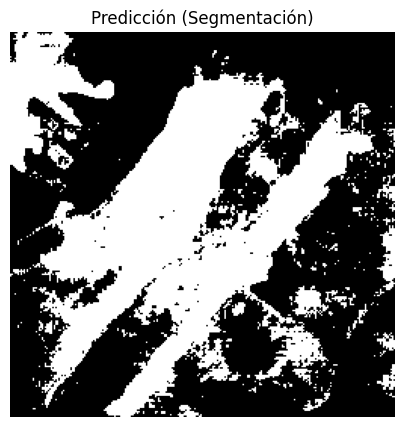

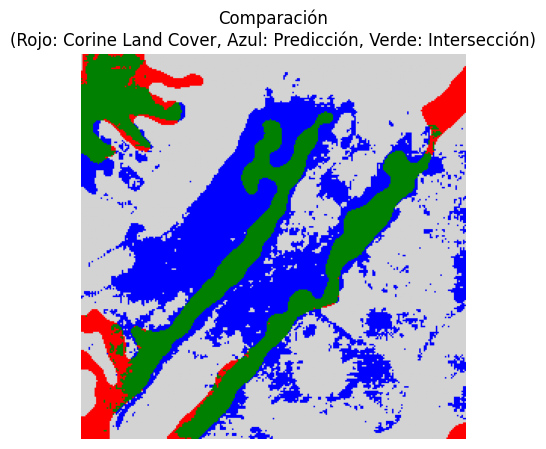

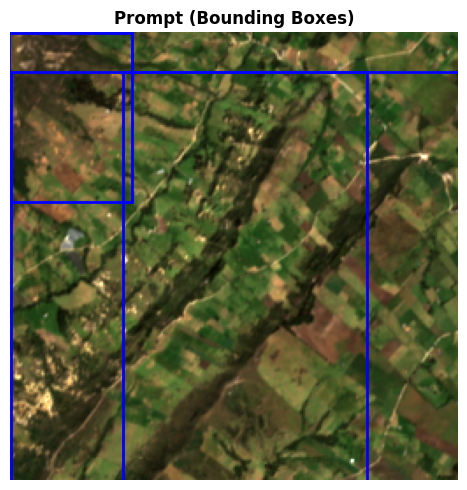


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 33.86%
   • DICE Coefficient:              50.59%
   • Pixel Accuracy:                70.10%
   • F1-Score:                      50.59%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    75.43%
   • FPR (False Positive Rate):     31.25%
   • Precision:                     38.06%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           9952
   • False Positives (FP):          16199
   • True Negatives (TN):           35632
   • False Negatives (FN):          3242

############################################################
🔄 Procesando tile 13 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 13
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_13_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_13_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 7 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIV

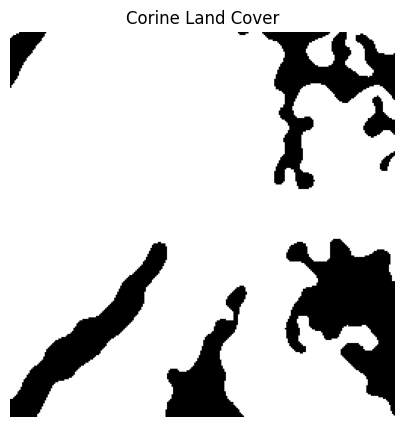

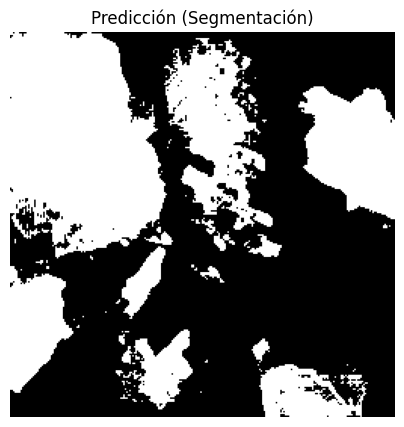

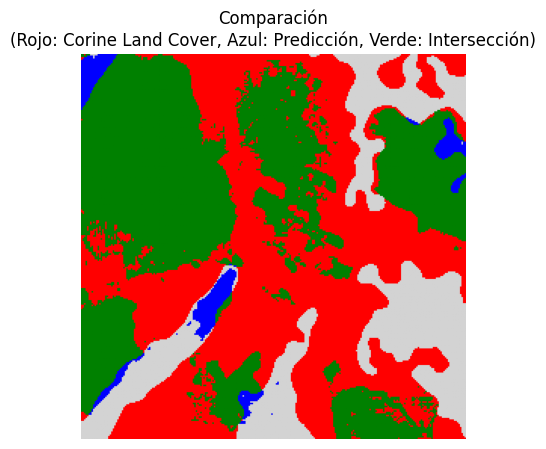

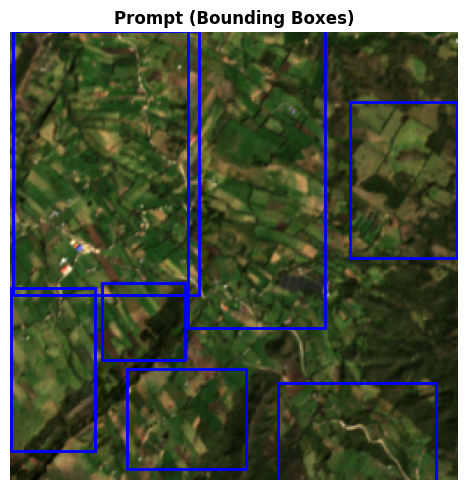


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 46.53%
   • DICE Coefficient:              63.51%
   • Pixel Accuracy:                55.77%
   • F1-Score:                      63.51%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    48.01%
   • FPR (False Positive Rate):     12.85%
   • Precision:                     93.79%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           25030
   • False Positives (FP):          1657
   • True Negatives (TN):           11235
   • False Negatives (FN):          27103

############################################################
🔄 Procesando tile 14 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 14
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_14_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_14_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/bo

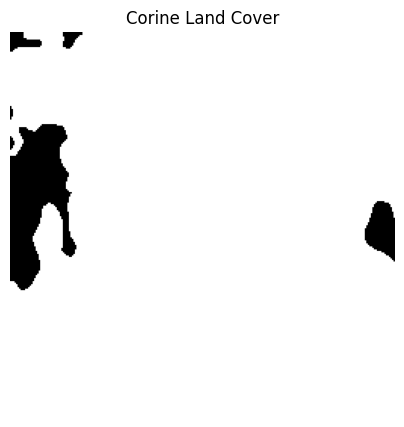

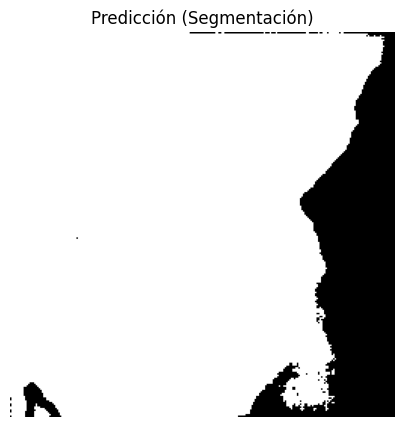

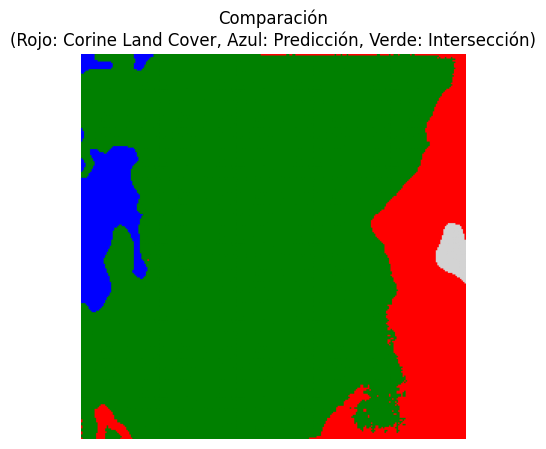

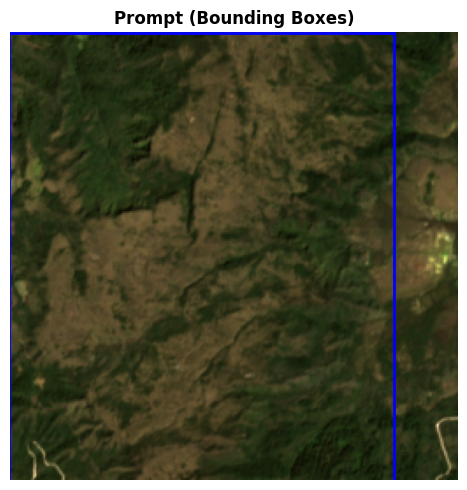


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 78.33%
   • DICE Coefficient:              87.85%
   • Pixel Accuracy:                78.52%
   • F1-Score:                      87.85%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    82.47%
   • FPR (False Positive Rate):     85.13%
   • Precision:                     93.98%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           50491
   • False Positives (FP):          3234
   • True Negatives (TN):           565
   • False Negatives (FN):          10735

############################################################
🔄 Procesando tile 15 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 15
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_15_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_15_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 2 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA

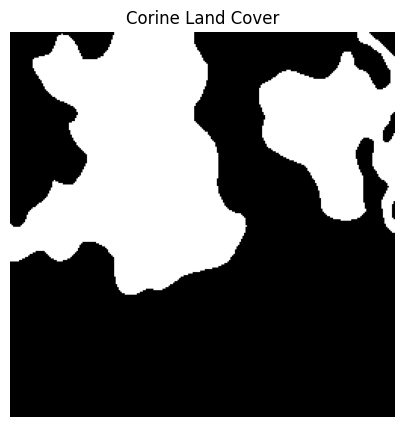

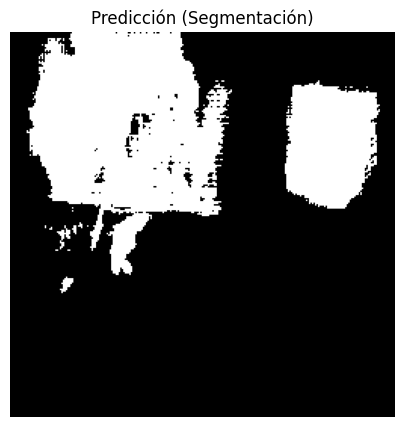

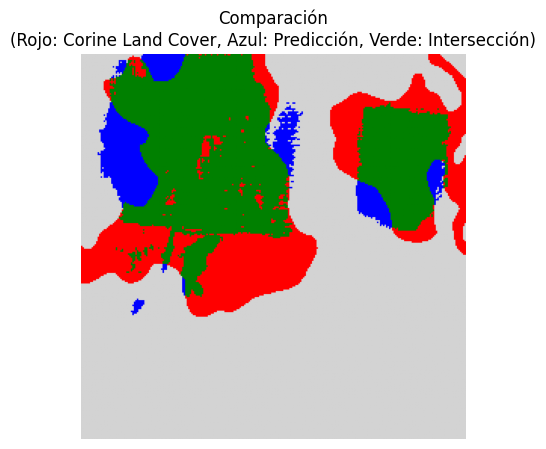

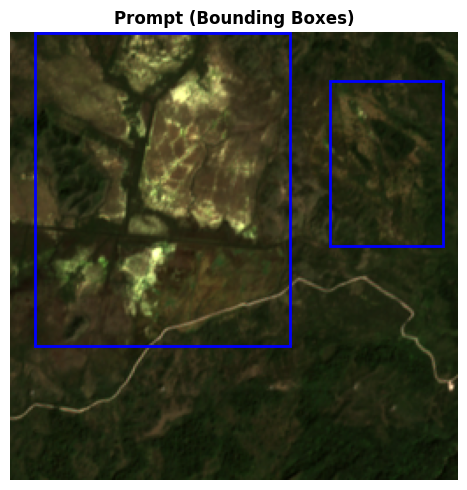


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 54.40%
   • DICE Coefficient:              70.46%
   • Pixel Accuracy:                81.36%
   • F1-Score:                      70.46%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    61.98%
   • FPR (False Positive Rate):     7.80%
   • Precision:                     81.64%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           14458
   • False Positives (FP):          3252
   • True Negatives (TN):           38447
   • False Negatives (FN):          8868

############################################################
🔄 Procesando tile 16 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 16
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_16_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_16_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 11 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIV

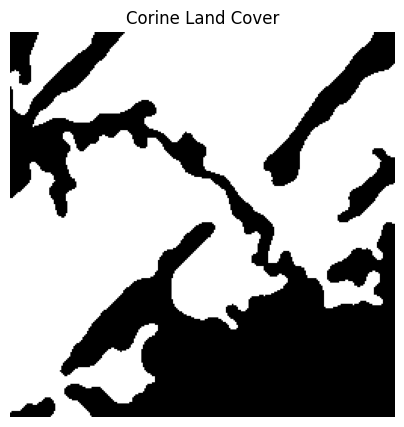

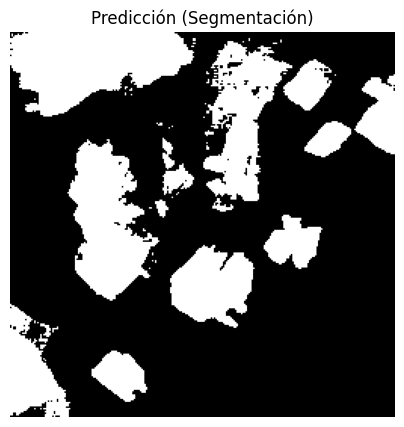

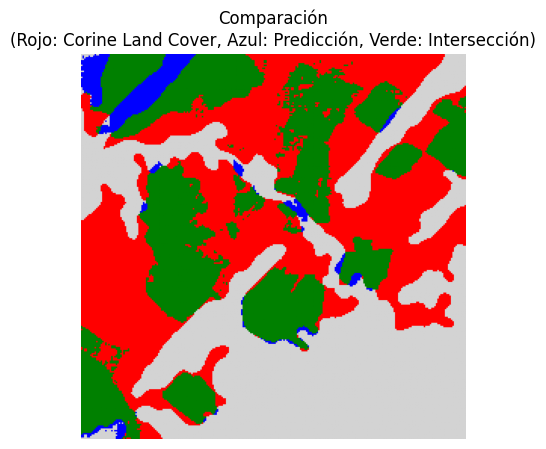

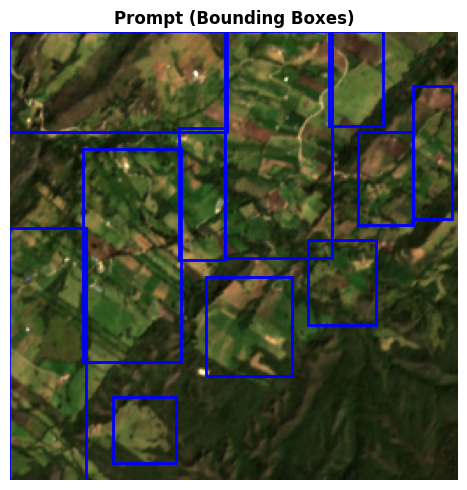


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 41.76%
   • DICE Coefficient:              58.91%
   • Pixel Accuracy:                62.83%
   • F1-Score:                      58.91%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    43.77%
   • FPR (False Positive Rate):     7.50%
   • Precision:                     90.08%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           17327
   • False Positives (FP):          1908
   • True Negatives (TN):           23529
   • False Negatives (FN):          22261

############################################################
🔄 Procesando tile 17 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 17
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_17_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_17_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 4 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIV

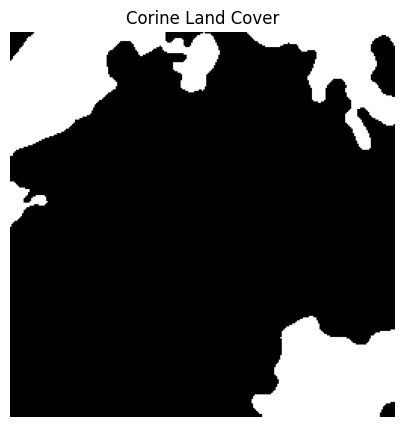

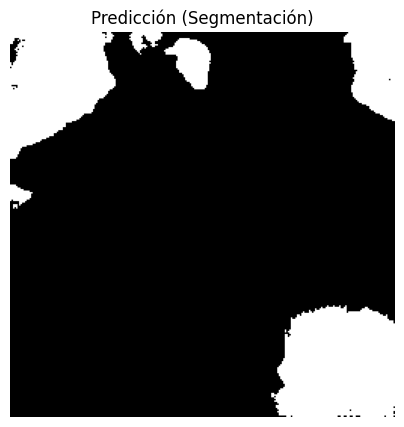

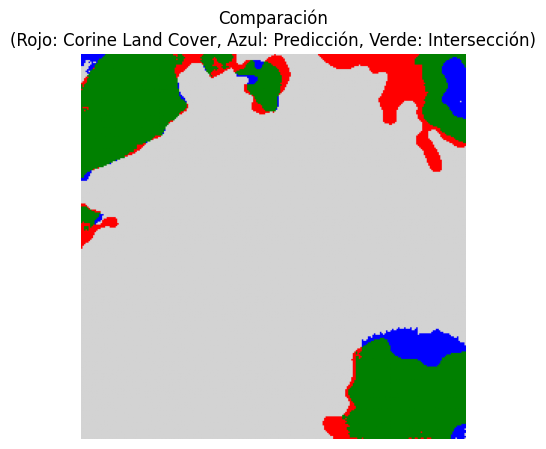

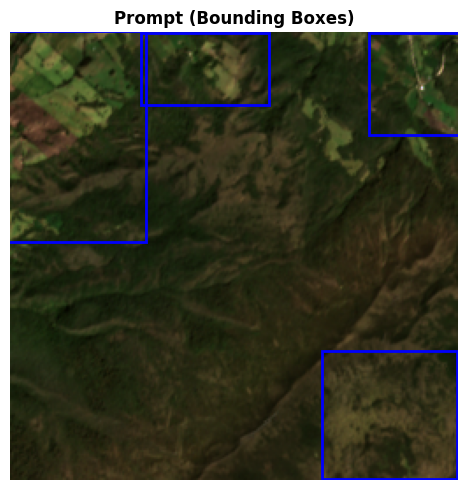


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 68.32%
   • DICE Coefficient:              81.18%
   • Pixel Accuracy:                92.87%
   • F1-Score:                      81.18%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    77.62%
   • FPR (False Positive Rate):     3.36%
   • Precision:                     85.09%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           10001
   • False Positives (FP):          1753
   • True Negatives (TN):           50387
   • False Negatives (FN):          2884

############################################################
🔄 Procesando tile 18 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 18
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_18_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_18_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 3 polígonos/boxe

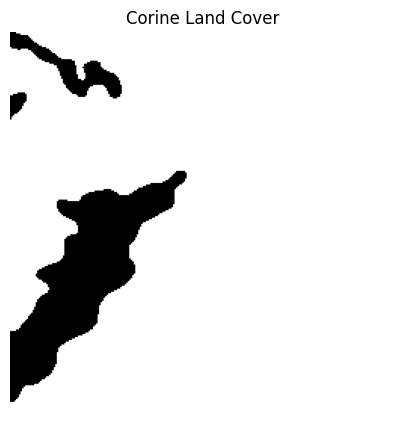

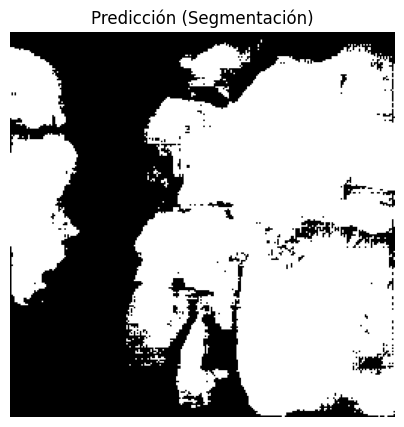

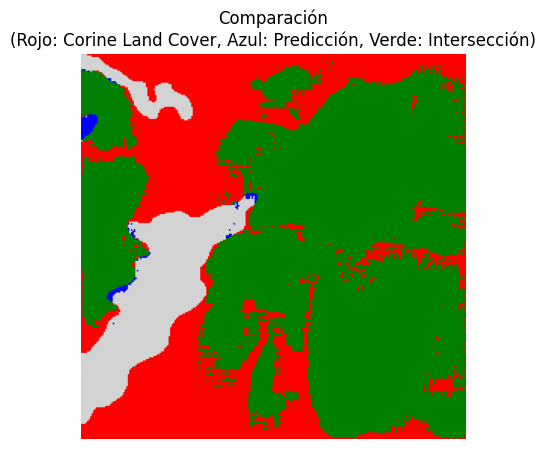

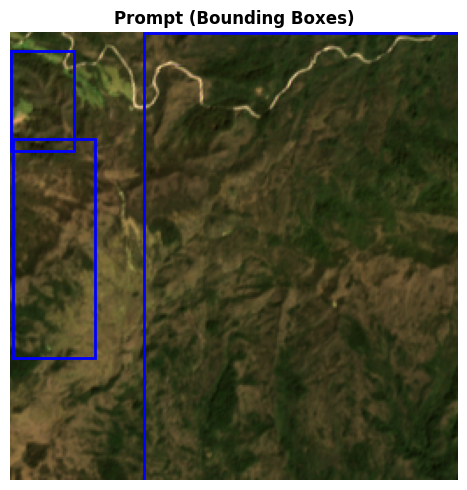


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 64.91%
   • DICE Coefficient:              78.72%
   • Pixel Accuracy:                68.68%
   • F1-Score:                      78.72%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    65.22%
   • FPR (False Positive Rate):     3.73%
   • Precision:                     99.29%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           37673
   • False Positives (FP):          271
   • True Negatives (TN):           6989
   • False Negatives (FN):          20092

############################################################
🔄 Procesando tile 19 con código CORINE 321113
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 19
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_19_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_19_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 1 polígonos/boxes

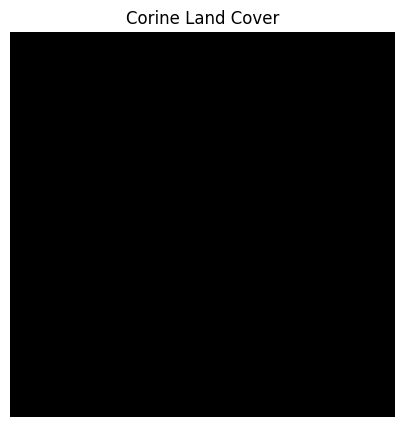

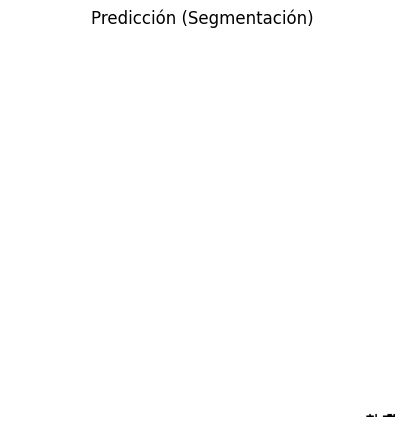

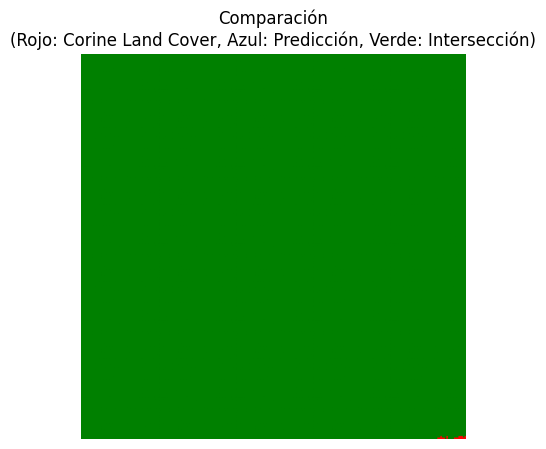

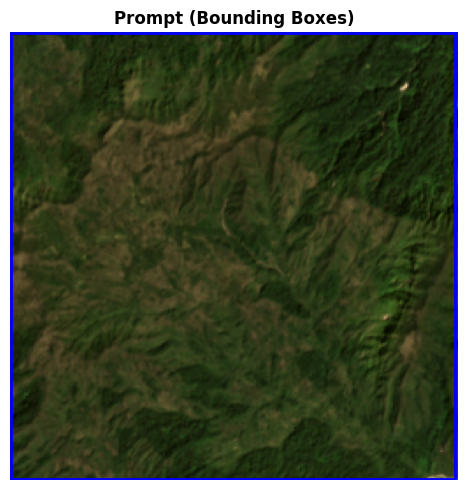


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 99.97%
   • DICE Coefficient:              99.98%
   • Pixel Accuracy:                99.97%
   • F1-Score:                      99.98%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.97%
   • FPR (False Positive Rate):     0.00%
   • Precision:                     100.00%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           65005
   • False Positives (FP):          0
   • True Negatives (TN):           0
   • False Negatives (FN):          20

############################################################
🔄 Procesando tile 20 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 20
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_20_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_20_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 6 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA CON SAM

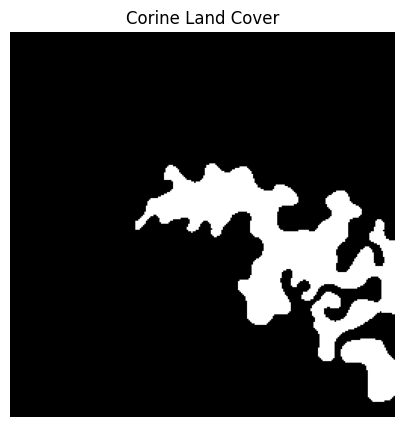

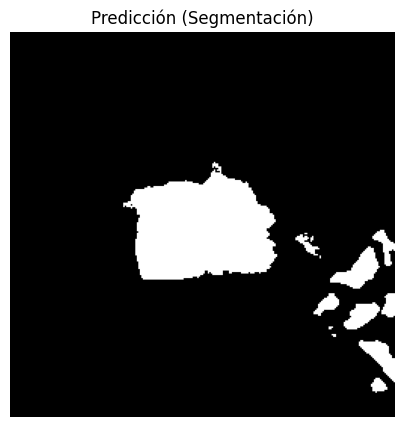

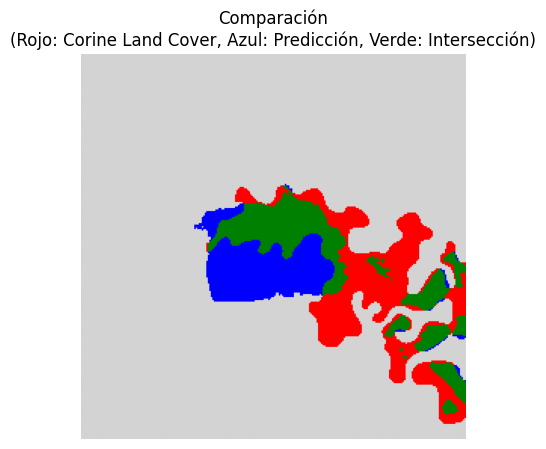

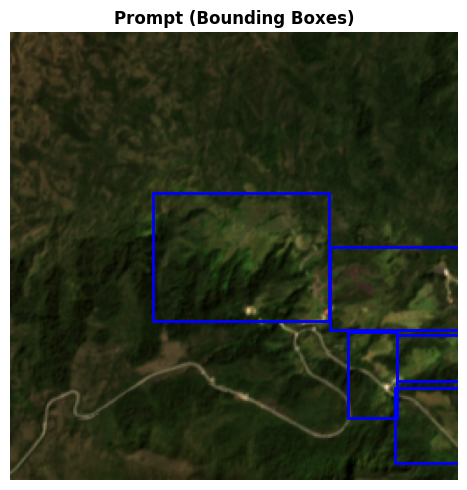


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 31.63%
   • DICE Coefficient:              48.06%
   • Pixel Accuracy:                87.41%
   • F1-Score:                      48.06%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    43.19%
   • FPR (False Positive Rate):     5.70%
   • Precision:                     54.18%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           3788
   • False Positives (FP):          3204
   • True Negatives (TN):           53050
   • False Negatives (FN):          4983

############################################################
🔄 Procesando tile 21 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 21
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_21_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_21_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 4 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA 

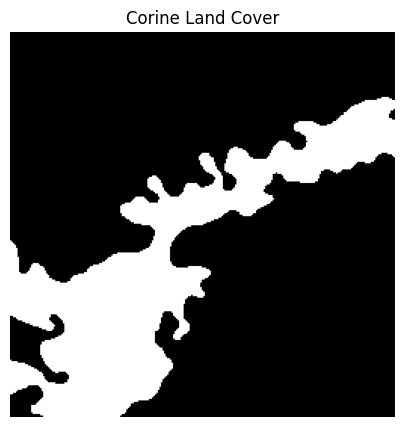

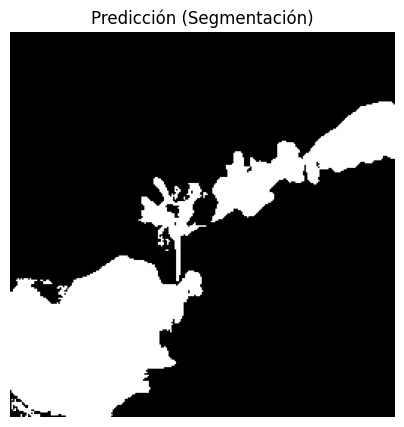

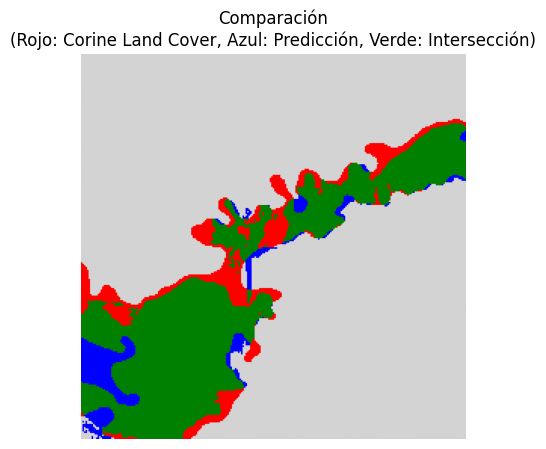

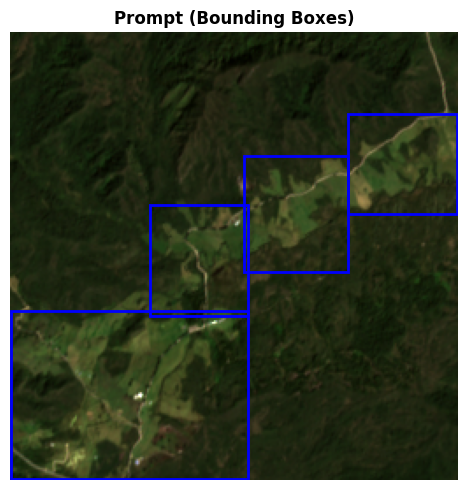


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 70.70%
   • DICE Coefficient:              82.83%
   • Pixel Accuracy:                92.26%
   • F1-Score:                      82.83%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    78.69%
   • FPR (False Positive Rate):     3.51%
   • Precision:                     87.44%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           12135
   • False Positives (FP):          1743
   • True Negatives (TN):           47860
   • False Negatives (FN):          3287

############################################################
🔄 Procesando tile 22 con código CORINE 231
############################################################

📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile 22
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_22_crop.tif
   • Boxes: ../tiles/Poligonos/Guatavita_22_box.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 2 polígonos/boxes

🎯 PASO 2: SEGMENTACIÓN ITERATIVA

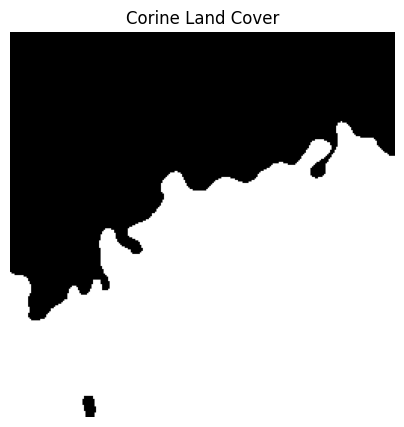

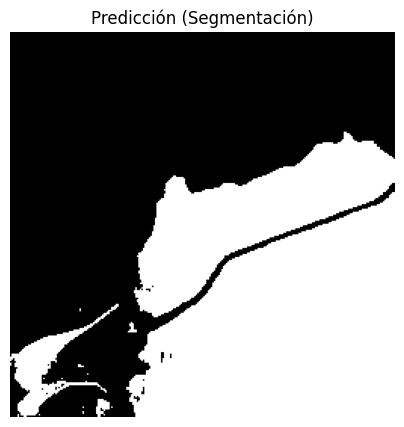

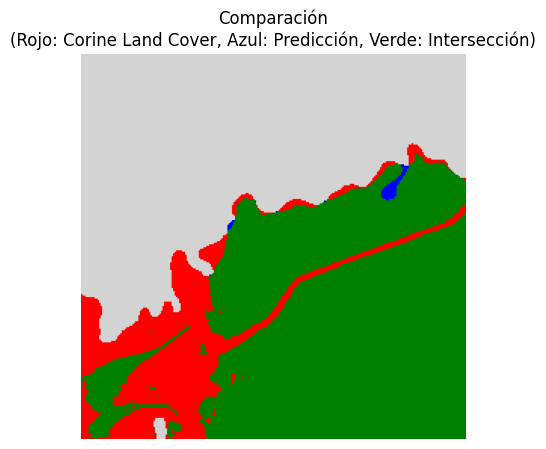

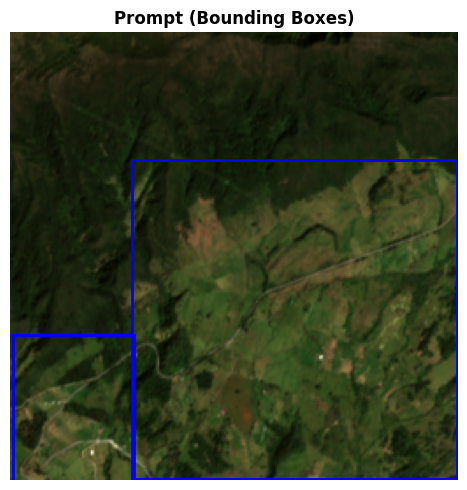


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 77.81%
   • DICE Coefficient:              87.52%
   • Pixel Accuracy:                87.77%
   • F1-Score:                      87.52%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    78.15%
   • FPR (False Positive Rate):     0.54%
   • Precision:                     99.44%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           27889
   • False Positives (FP):          157
   • True Negatives (TN):           29182
   • False Negatives (FN):          7797

✅ PROCESAMIENTO FINALIZADO - RESUMEN


ValueError: Invalid format specifier '.4f if iou else 'N/A'' for object of type 'float'

In [59]:
# 📋 CÓDIGOS CORINE PARA EVALUACIÓN
CODIGOS_CORINE = {
    512: "Cuerpos de agua",
    111: "Tejido urbano continuo",
    231: "Pastos limpios",
    321113: "Herbazal denso de tierra firme con arbustos"
}

def geojson_to_raster(geojson_path, reference_tif_path, output_path, codigo_filtro):
    """Convierte un GeoJSON a raster usando un archivo TIFF de referencia"""
    gdf = gpd.read_file(geojson_path)
    gdf_filtrado = gdf[gdf['codigo'] == codigo_filtro]
    
    with rasterio.open(reference_tif_path) as ref:
        transform = ref.transform
        width = ref.width
        height = ref.height
        crs = ref.crs
    
    mask = features.rasterize(
        ((geom, 0) for geom in gdf_filtrado.geometry),
        out_shape=(height, width),
        transform=transform,
        fill=1,
        dtype='uint8'
    )
    
    with rasterio.open(
        output_path, 'w',
        driver='GTiff',
        height=height,
        width=width,
        count=1,
        dtype=mask.dtype,
        crs=crs,
        transform=transform,
    ) as dst:
        dst.write(mask, 1)
    
    return mask

def calculate_metrics_box(mask_path, land_path, target_value=0):
    """Calcula métricas DICE, IoU, Pixel Accuracy, TPR, FPR, Precision, F1 para box prompts"""
    with rasterio.open(mask_path) as src1:
        raster1 = src1.read(1)
    
    with rasterio.open(land_path) as src2:
        raster2 = src2.read(1)

    mask1 = (raster1 == target_value).astype(int)
    mask2 = (raster2 != target_value).astype(int)
    
    intersection = np.sum(mask1 & mask2)
    union = np.sum(mask1 | mask2)
    sum_masks = np.sum(mask1) + np.sum(mask2)

    FP = np.sum(mask2) - intersection
    FN = np.sum(mask1) - intersection
    TN = mask1.size - intersection - FP - FN

    if union == 0:
        iou = 1.0 if intersection == 0 else 0.0
        dice = 1.0 if sum_masks == 0 else 0.0
    else:
        iou = intersection / union
        dice = (2 * intersection) / sum_masks if sum_masks > 0 else 0.0

    pixel_accuracy = (intersection + TN) / mask1.size
    tpr = intersection / (intersection + FN) if (intersection + FN) > 0 else 0.0
    fpr = FP / (FP + TN) if (FP + TN) > 0 else 0.0
    precision = intersection / (intersection + FP) if (intersection + FP) > 0 else 0.0
    f1_score = 2 * (precision * tpr) / (precision + tpr) if (precision + tpr) > 0 else 0.0

    # Visualización
    comparison = np.zeros_like(mask1)
    comparison[mask1 == 1] = 1
    comparison[mask2 == 1] = 2
    comparison[(mask1 == 1) & (mask2 == 1)] = 3

    import re
    from matplotlib.patches import Rectangle
    tile_match = re.search(r'Guatavita_(\d+)', mask_path)
    if tile_match:
        tile_num = tile_match.group(1)
        image_path = f'../tiles/Sentinel/Guatavita_{tile_num}_crop.tif'
        box_path = f'../tiles/Poligonos/Guatavita_{tile_num}_box.geojson'
        
        # Cargar imagen
        with rasterio.open(image_path) as src:
            img_rgb = src.read([1, 2, 3]).transpose(1, 2, 0)
            # Normalizar para visualización
            img_rgb = (img_rgb - img_rgb.min()) / (img_rgb.max() - img_rgb.min())
        
        # Cargar bounding boxes
        gdf_boxes = gpd.read_file(box_path)
        if gdf_boxes.crs is None:
            gdf_boxes = gdf_boxes.set_crs("EPSG:4326")
        
        # Convertir boxes a píxeles
        all_boxes_vis = []
        from rasterio.transform import rowcol
        with rasterio.open(image_path) as src:
            for geom in gdf_boxes.geometry:
                bounds = geom.bounds
                min_row, min_col = rowcol(src.transform, bounds[0], bounds[3])
                max_row, max_col = rowcol(src.transform, bounds[2], bounds[1])
                box_coords = np.array([min_col, min_row, max_col, max_row])
                all_boxes_vis.append(box_coords)
    else:
        img_rgb = None
        all_boxes_vis = None

    fig, axes = plt.subplots(1, 1, figsize=(5, 5))
    fig, axes1 = plt.subplots(1, 1, figsize=(5, 5))
    fig, axes2 = plt.subplots(1, 1, figsize=(5, 5))
    fig, axes4 = plt.subplots(1, 1, figsize=(5, 5))

    # Panel 1: Prompt (imagen con bounding boxes)
    if img_rgb is not None and all_boxes_vis is not None:
        axes4.imshow(img_rgb)
        for i, box in enumerate(all_boxes_vis):
            rect = Rectangle(
                (box[0], box[1]),
                box[2] - box[0],
                box[3] - box[1],
                linewidth=2,
                edgecolor='blue',
                facecolor='none'
            )
            axes4.add_patch(rect)
        axes4.set_title('Prompt (Bounding Boxes)', fontsize=12, fontweight='bold')
    else:
        axes4.text(0.5, 0.5, 'Prompt no disponible', ha='center', va='center')
        axes4.set_title('Prompt', fontsize=12, fontweight='bold')
    axes4.axis('off')

    axes.imshow(mask1, cmap='gray')
    axes.set_title('Corine Land Cover')
    axes.axis('off')

    axes1.imshow(mask2, cmap='gray')
    axes1.set_title('Predicción (Segmentación)')
    axes1.axis('off')
    
    colors = ['lightgray', 'red', 'blue', 'green']
    cmap = plt.matplotlib.colors.ListedColormap(colors)
    
    im = axes2.imshow(comparison, cmap=cmap, vmin=0, vmax=3)
    axes2.set_title('Comparación\n(Rojo: Corine Land Cover, Azul: Predicción, Verde: Intersección)')
    axes2.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return {
        'IoU': iou,
        'DICE': dice,
        'Pixel_Accuracy': pixel_accuracy,
        'TPR_Sensitivity_Recall': tpr,
        'FPR': fpr,
        'Precision': precision,
        'F1_Score': f1_score,
        'TP': intersection,
        'FP': FP,
        'TN': TN,
        'FN': FN
    }

def print_metrics_percent(results):
    """Imprime las métricas en formato porcentaje"""
    if results is None:
        print("No hay resultados para mostrar.")
        return

    def pct(x):
        return f"{x*100:.2f}%" if x is not None else "N/A"

    print(f"\n🎯 MÉTRICAS PRINCIPALES:")
    print(f"   • IoU (Intersection over Union): {pct(results.get('IoU'))}")
    print(f"   • DICE Coefficient:              {pct(results.get('DICE'))}")
    print(f"   • Pixel Accuracy:                {pct(results.get('Pixel_Accuracy'))}")
    print(f"   • F1-Score:                      {pct(results.get('F1_Score'))}")

    print(f"\n📊 SENSIBILIDAD Y ESPECIFICIDAD:")
    print(f"   • TPR (Sensitivity / Recall):    {pct(results.get('TPR_Sensitivity_Recall'))}")
    print(f"   • FPR (False Positive Rate):     {pct(results.get('FPR'))}")
    print(f"   • Precision:                     {pct(results.get('Precision'))}")

    print(f"\n🔢 MATRIZ DE CONFUSIÓN:")
    print(f"   • True Positives (TP):           {int(results.get('TP', 0))}")
    print(f"   • False Positives (FP):          {int(results.get('FP', 0))}")
    print(f"   • True Negatives (TN):           {int(results.get('TN', 0))}")
    print(f"   • False Negatives (FN):          {int(results.get('FN', 0))}")

def segment_with_box_and_evaluate(tile_number, codigo_corine):
    """
    Segmentación automática con bounding boxes y evaluación de métricas
    
    Args:
        tile_number (int): Número del tile (0-22)
        codigo_corine (int): Código CORINE Land Cover a evaluar
    
    Returns:
        dict: Métricas de evaluación
    """
    # Generar nombres de archivos
    base_name = f"Guatavita_{tile_number}"
    
    # Rutas de entrada
    image_path = f'../tiles/Sentinel/{base_name}_crop.tif'
    box_coords_path = f'../tiles/Poligonos/{base_name}_box.geojson'
    geojson_path = f'../tiles/LandUse/{base_name}_crop.geojson'
    
    # Rutas de salida
    segmentation_output = f'../tiles/segmentation_box/{base_name}_box_mask.tif'
    landuse_raster_output = f'../tiles/LandUseRaster/{base_name}_codigo{codigo_corine}_raster.tif'
    
    # Crear directorios
    os.makedirs('../tiles/segmentation_box', exist_ok=True)
    os.makedirs('../tiles/LandUseRaster', exist_ok=True)
    
    # Verificar archivos de entrada
    if not os.path.exists(image_path):
        print(f"❌ Error: No se encuentra {image_path}")
        return None
    
    if not os.path.exists(box_coords_path):
        print(f"❌ Error: No se encuentra {box_coords_path}")
        return None
    
    print(f"\n{'='*60}")
    print(f"📦 SEGMENTACIÓN CON BOUNDING BOXES - Tile {tile_number}")
    print(f"{'='*60}")
    print(f"   • Código CORINE: {codigo_corine} - {CODIGOS_CORINE.get(codigo_corine, 'Desconocido')}")
    print(f"   • Imagen: {image_path}")
    print(f"   • Boxes: {box_coords_path}")
    
    # PASO 1: Cargar imagen y boxes
    print(f"\n📂 PASO 1: CARGA DE DATOS")
    
    # Crear predictor usando la variable global 'sam'
    predictor = SamPredictor(sam)
    
    with rasterio.open(image_path) as src:
        image = src.read().transpose(1, 2, 0)
        raster_crs = src.crs
        profile = src.profile.copy()
    
    predictor.set_image(image)
    
    # Leer boxes del GeoJSON
    gdf = gpd.read_file(box_coords_path)
    if gdf.crs is None:
        gdf = gdf.set_crs("EPSG:4326")
    
    print(f"   ✅ Cargados {len(gdf)} polígonos/boxes")
    
    # PASO 2: Segmentación iterativa
    print(f"\n🎯 PASO 2: SEGMENTACIÓN ITERATIVA CON SAM")
    
    from rasterio.transform import rowcol
    combined_mask = np.zeros((image.shape[0], image.shape[1]), dtype=bool)
    all_scores = []
    
    for idx, geom in enumerate(gdf.geometry):
        with rasterio.open(image_path) as src:
            bounds = geom.bounds
            min_row, min_col = rowcol(src.transform, bounds[0], bounds[3])
            max_row, max_col = rowcol(src.transform, bounds[2], bounds[1])
            box_coords = np.array([min_col, min_row, max_col, max_row])
        
        print(f"   📦 Procesando box {idx+1}/{len(gdf)}")
        
        masks, scores, logits = predictor.predict(
            box=box_coords,
            multimask_output=True
        )
        
        best_mask_idx = np.argmax(scores)
        best_score = scores[best_mask_idx]
        all_scores.append(best_score)
        
        combined_mask = combined_mask | masks[best_mask_idx]
        print(f"      ✅ Score: {best_score:.3f}")
    
    print(f"   ✅ Promedio de scores: {np.mean(all_scores):.3f}")
    
    # Convertir a uint8 y guardar
    best_mask = (combined_mask.astype(np.uint8)) * 255
    profile.update(dtype=rasterio.uint8, count=1)
    
    with rasterio.open(segmentation_output, 'w', **profile) as dst:
        dst.write(best_mask, 1)
    
    print(f"   💾 Máscara guardada: {segmentation_output}")
    
    # PASO 3: Convertir GeoJSON a raster
    print(f"\n🗺️ PASO 3: CONVERSIÓN GEOJSON A RASTER")
    geojson_to_raster(
        geojson_path=geojson_path,
        reference_tif_path=image_path,
        output_path=landuse_raster_output,
        codigo_filtro=codigo_corine
    )
    print(f"   ✅ Ground truth generado: {landuse_raster_output}")
    
    # PASO 4: Calcular métricas
    print(f"\n📊 PASO 4: CÁLCULO DE MÉTRICAS")
    results = calculate_metrics_box(
        mask_path=landuse_raster_output,
        land_path=segmentation_output,
        target_value=0
    )
    
    print_metrics_percent(results)
    
    return results

# 📋 PARES TILE-CÓDIGO CORINE
pairs = [
    {0:512}, {1:512}, {2:512}, {3:512}, {4:111}, {5:231}, {6:231},
    {7:321113}, {8:321113}, {9:321113}, {10:321113}, {11:321113},
    {12:321113}, {13:231}, {14:321113}, {15:231}, {16:231}, {17:231},
    {18:321113}, {19:321113}, {20:231}, {21:231}, {22:231}
]

# Normalizar a lista de tuplas
tiles_codes = []
for p in pairs:
    if isinstance(p, dict):
        for k, v in p.items():
            tiles_codes.append((int(k), int(v)))

# PROCESAMIENTO AUTOMÁTICO
results_all = {}
for tile, code in tiles_codes:
    print(f"\n{'#'*60}")
    print(f"🔄 Procesando tile {tile} con código CORINE {code}")
    print(f"{'#'*60}")
    
    try:
        res = segment_with_box_and_evaluate(tile, code)
        results_all[f"tile_{tile}"] = {
            "codigo": code,
            "descripcion": CODIGOS_CORINE.get(code, "Desconocido"),
            "results": res
        }
    except Exception as e:
        print(f"❌ Error procesando tile {tile}: {e}")

# RESUMEN FINAL
print(f"\n{'='*60}")
print(f"✅ PROCESAMIENTO FINALIZADO - RESUMEN")
print(f"{'='*60}")
for k, v in results_all.items():
    iou = v["results"].get("IoU") if v["results"] else None
    print(f"{k} -> {v['descripcion']} (código {v['codigo']}) | IoU: {iou:.4f if iou else 'N/A'}")